In [45]:
import os
import cv2
import glob
import PIL
import shutil
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from skimage import data
from skimage.util import montage 
import skimage.transform as skTrans
from skimage.transform import rotate
from skimage.transform import resize
from PIL import Image, ImageOps
import random

# neural imaging
import nilearn as nl
import nibabel as nib
import nilearn.plotting as nlplt
!pip install git+https://github.com/miykael/gif_your_nifti
import gif_your_nifti.core as gif2nif


# ml libs
import keras
import keras.backend as K
from keras.callbacks import CSVLogger
import tensorflow as tf
from tensorflow.keras.utils import plot_model
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard
from tensorflow.keras.layers.experimental import preprocessing


# Make numpy printouts easier to read.
np.set_printoptions(precision=3, suppress=True)

  Cloning https://github.com/miykael/gif_your_nifti to /tmp/pip-req-build-u3w028jq
  Running command git clone -q https://github.com/miykael/gif_your_nifti /tmp/pip-req-build-u3w028jq
You should consider upgrading via the '/opt/conda/bin/python3.7 -m pip install --upgrade pip' command.


In [26]:
import plotly.graph_objects as go
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

from skimage import measure
from skimage.draw import ellipsoid
import nibabel as nib
import plotly.express as px

# **Improved Median Filtering**

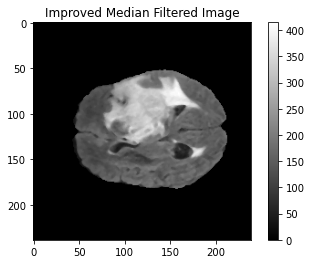

In [27]:
import numpy as np
from scipy.ndimage import median_filter
import nibabel as nib

def improved_median_filter(image, kernel_size=3):
    padded_image = np.pad(image, kernel_size // 2, mode='reflect')
    filtered_image = median_filter(padded_image, size=kernel_size)
    return filtered_image[kernel_size // 2:-kernel_size // 2, kernel_size // 2:-kernel_size // 2]


mri_scan = nib.load('/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_001/BraTS20_Training_001_flair.nii').get_fdata()
filtered_mri_scan = improved_median_filter(mri_scan)

plt.imshow(filtered_mri_scan[:, :, mri_scan.shape[2] // 2], cmap='gray')
plt.title('Improved Median Filtered Image')
plt.colorbar()  # Add a colorbar
plt.show()

In [28]:
#improved Median Filtering
import os
import numpy as np
from scipy.ndimage import median_filter
import nibabel as nib

def improved_median_filter(image, kernel_size=3):
    padded_image = np.pad(image, kernel_size // 2, mode='reflect')
    filtered_image = median_filter(padded_image, size=kernel_size)
    return filtered_image[kernel_size // 2:-kernel_size // 2, kernel_size // 2:-kernel_size // 2]

training_data_dir = '/kaggle/input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData'
filtered_training_path = "/kaggle/working"

processed_cases = 0
for patient_folder in os.listdir(training_data_dir):
    processed_cases += 1
    if processed_cases > 20:
        break
    
    patient_folder_path = os.path.join(training_data_dir, patient_folder)
    sub = os.listdir(patient_folder_path)
    if os.path.isdir(patient_folder_path):
        for mri_type in sub:
            mri_path = os.path.join(patient_folder_path,mri_type)
            if os.path.exists(mri_path):
                mri_scan = nib.load(mri_path).get_fdata()
                filtered_mri_scan = improved_median_filter(mri_scan)
                filtered_mri_filename = f'filtered_BraTS20_Training_{patient_folder}_{mri_type}.nii'
                filtered_mri_path = os.path.join(filtered_training_path, filtered_mri_filename)
                nib.save(nib.Nifti1Image(filtered_mri_scan, affine=None), filtered_mri_path)
                print(f'Processed {mri_type} for {patient_folder} in training data')

Processed BraTS20_Training_083_flair.nii for BraTS20_Training_083 in training data
Processed BraTS20_Training_083_t1.nii for BraTS20_Training_083 in training data
Processed BraTS20_Training_083_seg.nii for BraTS20_Training_083 in training data
Processed BraTS20_Training_083_t2.nii for BraTS20_Training_083 in training data
Processed BraTS20_Training_083_t1ce.nii for BraTS20_Training_083 in training data


KeyboardInterrupt: 

In [29]:
SEGMENT_CLASSES = {
    0 : 'NOT tumor',
    1 : 'NECROTIC/CORE',
    2 : 'EDEMA',
    3 : 'ENHANCING'
}
VOLUME_SLICES = 100 
VOLUME_START_AT = 22

# Image data descriptions

All BraTS multimodal scans are available as  NIfTI files (.nii.gz) -> commonly used medical imaging format to store brain imagin data obtained using MRI and describe different MRI settings 
1. **T1**: T1-weighted, native image, sagittal or axial 2D acquisitions, with 1–6 mm slice thickness.
2. **T1c**: T1-weighted, contrast-enhanced (Gadolinium) image, with 3D acquisition and 1 mm isotropic voxel size for most patients.
3. **T2**: T2-weighted image, axial 2D acquisition, with 2–6 mm slice thickness.
4. **FLAIR**: T2-weighted FLAIR image, axial, coronal, or sagittal 2D acquisitions, 2–6 mm slice thickness.

Data were acquired with different clinical protocols and various scanners from multiple (n=19) institutions.

All the imaging datasets have been segmented manually, by one to four raters, following the same annotation protocol, and their annotations were approved by experienced neuro-radiologists. Annotations comprise the GD-enhancing tumor (ET — label 4), the peritumoral edema (ED — label 2), and the necrotic and non-enhancing tumor core (NCR/NET — label 1), as described both in the BraTS 2012-2013 TMI paper and in the latest BraTS summarizing paper. The provided data are distributed after their pre-processing, i.e., co-registered to the same anatomical template, interpolated to the same resolution (1 mm^3) and skull-stripped.

Volume of Region of Interest (ROI): 211979
Size of Region of Interest (ROI): (93, 110, 83)


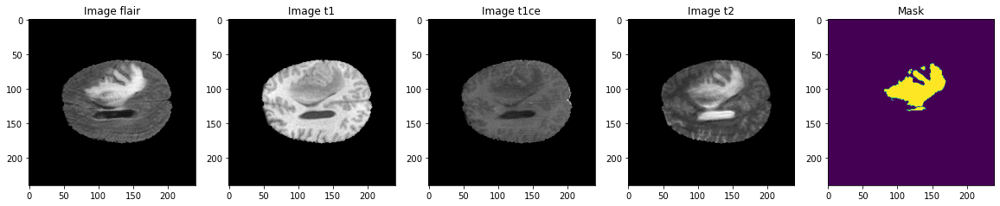

In [30]:
TRAIN_DATASET_PATH = '../input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/'
VALIDATION_DATASET_PATH = '../input/brats20-dataset-training-validation/BraTS2020_ValidationData/MICCAI_BraTS2020_ValidationData'

test_image_flair=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_flair.nii').get_fdata()
test_image_t1=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_t1.nii').get_fdata()
test_image_t1ce=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_t1ce.nii').get_fdata()
test_image_t2=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_t2.nii').get_fdata()
test_mask=nib.load(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_seg.nii').get_fdata()


fig, (ax1, ax2, ax3, ax4, ax5) = plt.subplots(1,5, figsize = (20, 10))
slice_w = 25
ax1.imshow(test_image_flair[:,:,test_image_flair.shape[0]//2-slice_w], cmap = 'gray')
ax1.set_title('Image flair')
ax2.imshow(test_image_t1[:,:,test_image_t1.shape[0]//2-slice_w], cmap = 'gray')
ax2.set_title('Image t1')
ax3.imshow(test_image_t1ce[:,:,test_image_t1ce.shape[0]//2-slice_w], cmap = 'gray')
ax3.set_title('Image t1ce')
ax4.imshow(test_image_t2[:,:,test_image_t2.shape[0]//2-slice_w], cmap = 'gray')
ax4.set_title('Image t2')
ax5.imshow(test_mask[:,:,test_mask.shape[0]//2-slice_w])
ax5.set_title('Mask')

# Calculate the volume of the Region of Interest (ROI)
binary_mask = (test_mask > 0).astype(np.uint8)
volume_roi = np.sum(binary_mask)

# Calculate the size of the ROI (bounding box)
roi_indices = np.where(binary_mask)
min_x, max_x = np.min(roi_indices[0]), np.max(roi_indices[0])
min_y, max_y = np.min(roi_indices[1]), np.max(roi_indices[1])
min_z, max_z = np.min(roi_indices[2]), np.max(roi_indices[2])
roi_size = (max_x - min_x + 1, max_y - min_y + 1, max_z - min_z + 1)

# Print the calculated volume and size
print("Volume of Region of Interest (ROI):", volume_roi)
print("Size of Region of Interest (ROI):", roi_size)

# Show the plot
plt.show()

**Show whole nifti data -> print each slice from 3d data**

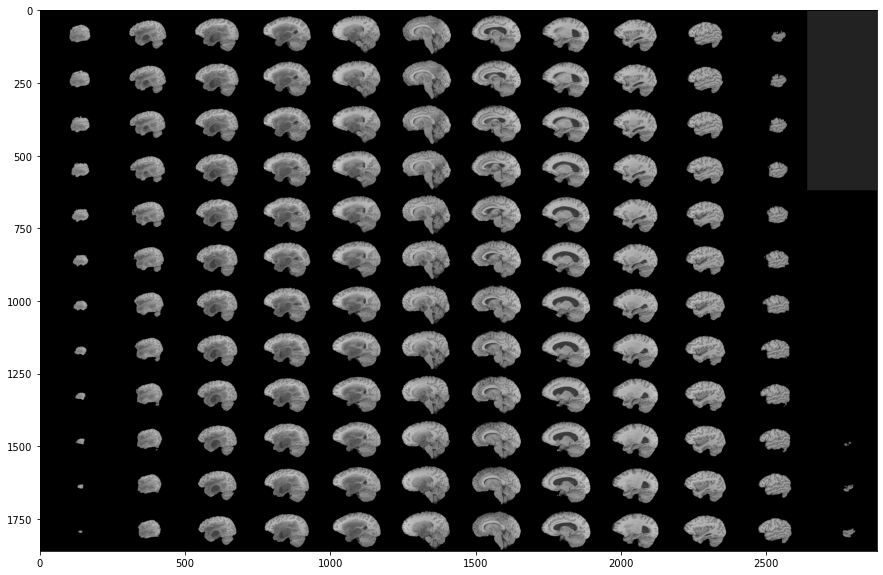

In [31]:
# Skip 50:-50 slices since there is not much to see
fig, ax1 = plt.subplots(1, 1, figsize = (15,15))
ax1.imshow(rotate(montage(test_image_t1[50:-50,:,:]), 90, resize=True), cmap ='gray')

**Show segment of tumor for each above slice**

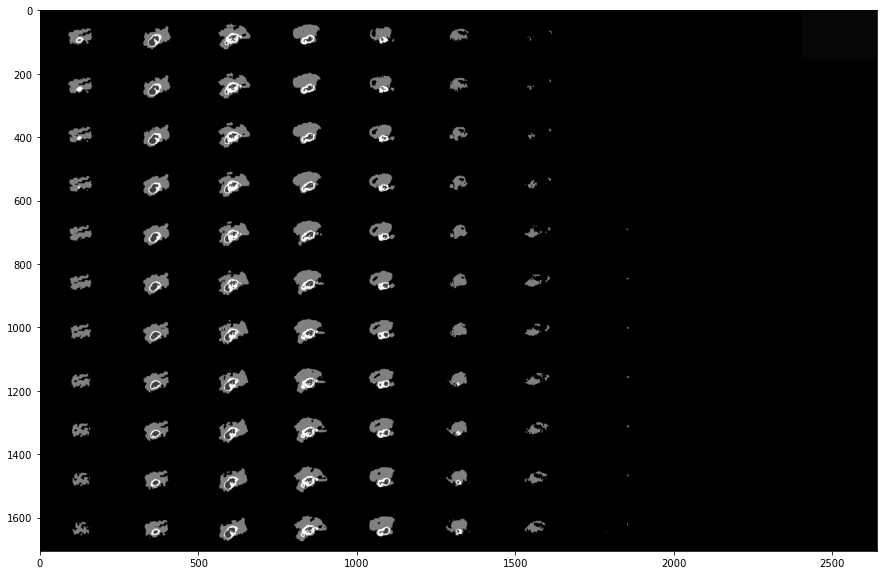

In [32]:
# Skip 50:-50 slices since there is not much to see
fig, ax1 = plt.subplots(1, 1, figsize = (15,15))
ax1.imshow(rotate(montage(test_mask[60:-60,:,:]), 90, resize=True), cmap ='gray')

**Show segments of tumor using different effects**

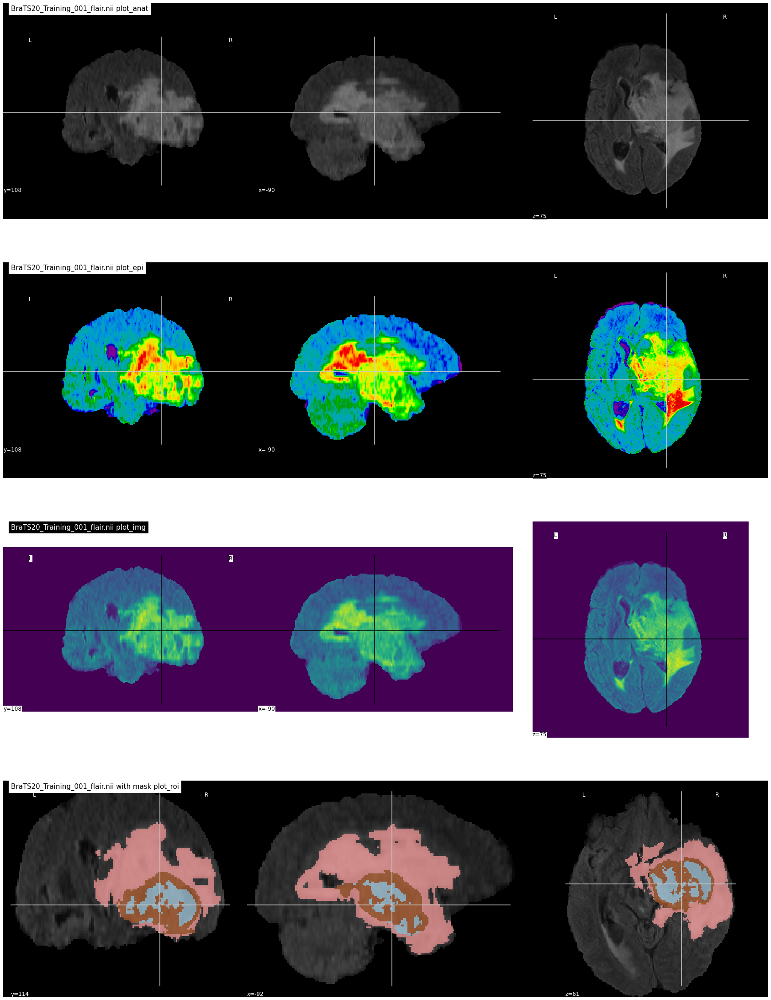

In [33]:
niimg = nl.image.load_img(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_flair.nii')
nimask = nl.image.load_img(TRAIN_DATASET_PATH + 'BraTS20_Training_001/BraTS20_Training_001_seg.nii')

fig, axes = plt.subplots(nrows=4, figsize=(30, 40))


nlplt.plot_anat(niimg,
                title='BraTS20_Training_001_flair.nii plot_anat',
                axes=axes[0])

nlplt.plot_epi(niimg,
               title='BraTS20_Training_001_flair.nii plot_epi',
               axes=axes[1])

nlplt.plot_img(niimg,
               title='BraTS20_Training_001_flair.nii plot_img',
               axes=axes[2])

nlplt.plot_roi(nimask, 
               title='BraTS20_Training_001_flair.nii with mask plot_roi',
               bg_img=niimg, 
               axes=axes[3], cmap='Paired')

plt.show()

# **U-Net Model**

In [34]:
# dice loss as defined above for 4 classes
def dice_coef(y_true, y_pred, smooth=1.0):
    class_num = 4
    for i in range(class_num):
        y_true_f = K.flatten(y_true[:,:,:,i])
        y_pred_f = K.flatten(y_pred[:,:,:,i])
        intersection = K.sum(y_true_f * y_pred_f)
        loss = ((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))
   #     K.print_tensor(loss, message='loss value for class {} : '.format(SEGMENT_CLASSES[i]))
        if i == 0:
            total_loss = loss
        else:
            total_loss = total_loss + loss
    total_loss = total_loss / class_num
#    K.print_tensor(total_loss, message=' total dice coef: ')
    return total_loss


 
# define per class evaluation of dice coef
# inspired by https://github.com/keras-team/keras/issues/9395
def dice_coef_necrotic(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,1] * y_pred[:,:,:,1]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,1])) + K.sum(K.square(y_pred[:,:,:,1])) + epsilon)

def dice_coef_edema(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,2] * y_pred[:,:,:,2]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,2])) + K.sum(K.square(y_pred[:,:,:,2])) + epsilon)

def dice_coef_enhancing(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,3] * y_pred[:,:,:,3]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,3])) + K.sum(K.square(y_pred[:,:,:,3])) + epsilon)



# Computing Precision 
def precision(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

    
# Computing Sensitivity      
def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())


# Computing Specificity
def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())

In [35]:
IMG_SIZE=128

In [36]:
def build_unet(inputs, ker_init, dropout):
    conv1 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(inputs)
    conv1 = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(conv1)
    
    pool = MaxPooling2D(pool_size=(2, 2))(conv1)
    conv = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(pool)
    conv = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(conv)
    
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(pool1)
    conv2 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(conv2)
    
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(pool2)
    conv3 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(conv3)
    
    
    pool4 = MaxPooling2D(pool_size=(2, 2))(conv3)
    conv5 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(pool4)
    conv5 = Conv2D(512, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(conv5)
    drop5 = Dropout(dropout)(conv5)

    up7 = Conv2D(256, 2, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(UpSampling2D(size = (2,2))(drop5))
    merge7 = concatenate([conv3,up7], axis = 3)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(merge7)
    conv7 = Conv2D(256, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(conv7)

    up8 = Conv2D(128, 2, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(UpSampling2D(size = (2,2))(conv7))
    merge8 = concatenate([conv2,up8], axis = 3)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(merge8)
    conv8 = Conv2D(128, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(conv8)

    up9 = Conv2D(64, 2, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(UpSampling2D(size = (2,2))(conv8))
    merge9 = concatenate([conv,up9], axis = 3)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(merge9)
    conv9 = Conv2D(64, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(conv9)
    
    up = Conv2D(32, 2, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(UpSampling2D(size = (2,2))(conv9))
    merge = concatenate([conv1,up], axis = 3)
    conv = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(merge)
    conv = Conv2D(32, 3, activation = 'relu', padding = 'same', kernel_initializer = ker_init)(conv)
    
    conv10 = Conv2D(4, (1,1), activation = 'softmax')(conv)
    
    return Model(inputs = inputs, outputs = conv10)

input_layer = Input((IMG_SIZE, IMG_SIZE, 2))

model = build_unet(input_layer, 'he_normal', 0.2)
model.compile(loss="categorical_crossentropy", optimizer=keras.optimizers.Adam(learning_rate=0.001), metrics = ['accuracy',tf.keras.metrics.MeanIoU(num_classes=4), dice_coef, precision, sensitivity, specificity, dice_coef_necrotic, dice_coef_edema ,dice_coef_enhancing] )

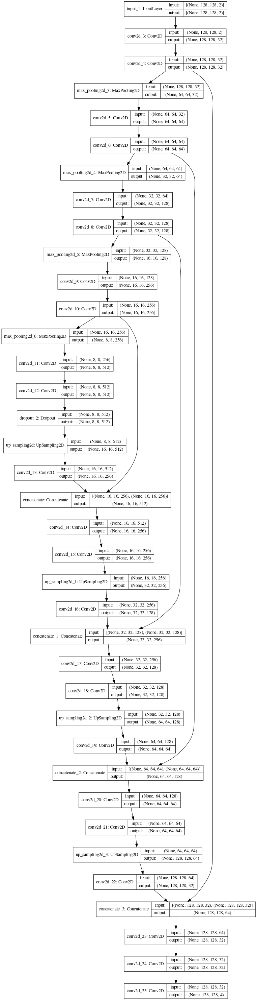

In [37]:
plot_model(model, 
           show_shapes = True,
           show_dtype=False,
           show_layer_names = True, 
           rankdir = 'TB', 
           expand_nested = False, 
           dpi = 70)

# Load data
Loading all data into memory is not a good idea since the data are too big to fit in.
So we will create dataGenerators

In [38]:
# lists of directories with studies
train_and_val_directories = [f.path for f in os.scandir(TRAIN_DATASET_PATH) if f.is_dir()]

# file BraTS20_Training_355 has ill formatted name for for seg.nii file
train_and_val_directories.remove(TRAIN_DATASET_PATH+'BraTS20_Training_355')


def pathListIntoIds(dirList):
    x = []
    for i in range(0,len(dirList)):
        x.append(dirList[i][dirList[i].rfind('/')+1:])
    return x

train_and_test_ids = pathListIntoIds(train_and_val_directories); 

    
train_test_ids, val_ids = train_test_split(train_and_test_ids,test_size=0.2) 
train_ids, test_ids = train_test_split(train_test_ids,test_size=0.15)

In [72]:
class DataGenerator(keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, dim=(IMG_SIZE,IMG_SIZE), batch_size = 1, n_channels = 2, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        Batch_ids = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(Batch_ids)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, Batch_ids):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.zeros((self.batch_size*VOLUME_SLICES, *self.dim, self.n_channels))
        y = np.zeros((self.batch_size*VOLUME_SLICES, 240, 240))
        Y = np.zeros((self.batch_size*VOLUME_SLICES, *self.dim, 4))

        
        # Generate data
        for c, i in enumerate(Batch_ids):
            case_path = os.path.join(TRAIN_DATASET_PATH, i)

            data_path = os.path.join(case_path, f'{i}_flair.nii');
            flair = nib.load(data_path).get_fdata()    

            data_path = os.path.join(case_path, f'{i}_t1ce.nii');
            ce = nib.load(data_path).get_fdata()
            
            data_path = os.path.join(case_path, f'{i}_seg.nii');
            seg = nib.load(data_path).get_fdata()
        
            for j in range(VOLUME_SLICES):
                 X[j +VOLUME_SLICES*c,:,:,0] = cv2.resize(flair[:,:,j+VOLUME_START_AT], (IMG_SIZE, IMG_SIZE));
                 X[j +VOLUME_SLICES*c,:,:,1] = cv2.resize(ce[:,:,j+VOLUME_START_AT], (IMG_SIZE, IMG_SIZE));

                 y[j +VOLUME_SLICES*c] = seg[:,:,j+VOLUME_START_AT];
                    
        # Generate masks
        y[y==4] = 3;
        mask = tf.one_hot(y, 4);
        Y = tf.image.resize(mask, (IMG_SIZE, IMG_SIZE));
        return X/np.max(X), Y
        
training_generator = DataGenerator(train_ids)
valid_generator = DataGenerator(val_ids)
test_generator = DataGenerator(test_ids)
num_images_to_select = len(test_ids)
true_path = f"/kaggle/input/brain-tumor-mri-dataset/Brain_Tumor_Detection/yes/"
no_path = f"/kaggle/input/brain-tumor-mri-dataset/Brain_Tumor_Detection/no/"
yes = os.listdir(true_path)[:num_images_to_select]
no = os.listdir(no_path)[:num_images_to_select]
os.makedirs("test_images", exist_ok=True)

for i in range(num_images_to_select):
    original_name = yes[i]
    new_name = test_ids[i]
    source_path = f"/kaggle/input/brain-tumor-mri-dataset/Brain_Tumor_Detection/yes/{original_name}"
    destination_path = f"test_images/{new_name}.jpg"
    shutil.copyfile(source_path, destination_path)

**Number of data used**
for training / testing / validation

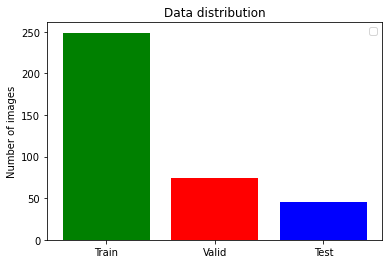

In [40]:
# show number of data for each dir 
def showDataLayout():
    plt.bar(["Train","Valid","Test"],
    [len(train_ids), len(val_ids), len(test_ids)], align='center',color=[ 'green','red', 'blue'])
    plt.legend()

    plt.ylabel('Number of images')
    plt.title('Data distribution')

    plt.show()
    
showDataLayout()

**Add callback for training process**

In [41]:
csv_logger = CSVLogger('training.log', separator=',', append=False)


callbacks = [
#     keras.callbacks.EarlyStopping(monitor='loss', min_delta=0,
#                               patience=2, verbose=1, mode='auto'),
      keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001, verbose=1),
#  keras.callbacks.ModelCheckpoint(filepath = 'model_.{epoch:02d}-{val_loss:.6f}.m5',
#                             verbose=1, save_best_only=True, save_weights_only = True)
        csv_logger
    ]

# Train model

In [24]:
model.compile(loss="categorical_crossentropy", optimizer=keras.optimizers.Adam(learning_rate=0.001), metrics = ['accuracy',tf.keras.metrics.MeanIoU(num_classes=4), dice_coef, precision, sensitivity, specificity, dice_coef_necrotic, dice_coef_edema, dice_coef_enhancing] )

In [ ]:
history =  model.fit(training_generator,
                    epochs=35,
                    steps_per_epoch=len(train_ids),
                    callbacks= callbacks,
                    validation_data = valid_generator
                    )
model.save("my_model.h5")

**Visualize the training process**

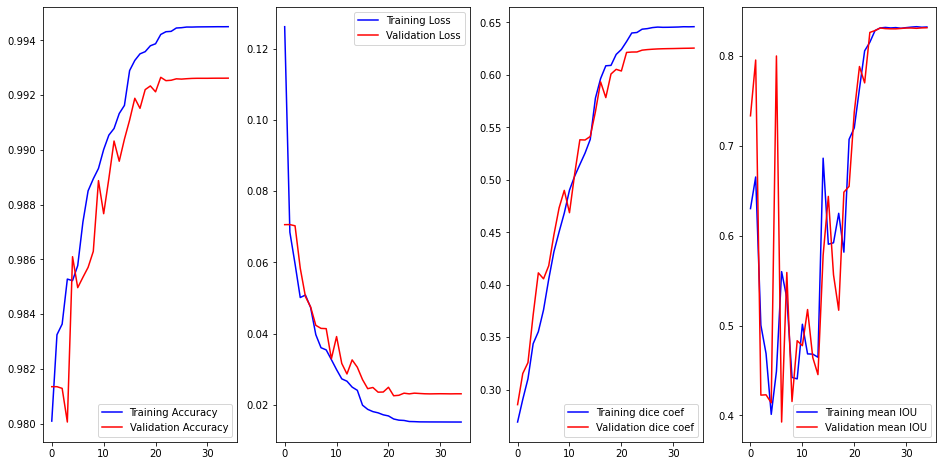

In [42]:
model = keras.models.load_model('../input/modelperclasseval/model_per_class.h5', 
                                   custom_objects={ 'accuracy' : tf.keras.metrics.MeanIoU(num_classes=4),
                                                   "dice_coef": dice_coef,
                                                   "precision": precision,
                                                   "sensitivity":sensitivity,
                                                   "specificity":specificity,
                                                   "dice_coef_necrotic": dice_coef_necrotic,
                                                   "dice_coef_edema": dice_coef_edema,
                                                   "dice_coef_enhancing": dice_coef_enhancing
                                                  }, compile=False)

history = pd.read_csv('../input/modelperclasseval/training_per_class.log', sep=',', engine='python')

hist=history

# hist=history.history

acc=hist['accuracy']
val_acc=hist['val_accuracy']

epoch=range(len(acc))

loss=hist['loss']
val_loss=hist['val_loss']

train_dice=hist['dice_coef']
val_dice=hist['val_dice_coef']

f,ax=plt.subplots(1,4,figsize=(16,8))

ax[0].plot(epoch,acc,'b',label='Training Accuracy')
ax[0].plot(epoch,val_acc,'r',label='Validation Accuracy')
ax[0].legend()

ax[1].plot(epoch,loss,'b',label='Training Loss')
ax[1].plot(epoch,val_loss,'r',label='Validation Loss')
ax[1].legend()

ax[2].plot(epoch,train_dice,'b',label='Training dice coef')
ax[2].plot(epoch,val_dice,'r',label='Validation dice coef')
ax[2].legend()

ax[3].plot(epoch,hist['mean_io_u'],'b',label='Training mean IOU')
ax[3].plot(epoch,hist['val_mean_io_u'],'r',label='Validation mean IOU')
ax[3].legend()

plt.show()

# Prediction examples

In [43]:
# mri type must one of 1) flair 2) t1 3) t1ce 4) t2 ------- or even 5) seg
# returns volume of specified study at `path`
def imageLoader(path):
    image = nib.load(path).get_fdata()
    X = np.zeros((self.batch_size*VOLUME_SLICES, *self.dim, self.n_channels))
    for j in range(VOLUME_SLICES):
        X[j +VOLUME_SLICES*c,:,:,0] = cv2.resize(image[:,:,j+VOLUME_START_AT], (IMG_SIZE, IMG_SIZE));
        X[j +VOLUME_SLICES*c,:,:,1] = cv2.resize(ce[:,:,j+VOLUME_START_AT], (IMG_SIZE, IMG_SIZE));

        y[j +VOLUME_SLICES*c] = seg[:,:,j+VOLUME_START_AT];
    return np.array(image)


# load nifti file at `path`
# and load each slice with mask from volume
# choose the mri type & resize to `IMG_SIZE`
def loadDataFromDir(path, list_of_files, mriType, n_images):
    scans = []
    masks = []
    for i in list_of_files[:n_images]:
        fullPath = glob.glob( i + '/*'+ mriType +'*')[0]
        currentScanVolume = imageLoader(fullPath)
        currentMaskVolume = imageLoader( glob.glob( i + '/*seg*')[0] ) 
        # for each slice in 3D volume, find also it's mask
        for j in range(0, currentScanVolume.shape[2]):
            scan_img = cv2.resize(currentScanVolume[:,:,j], dsize=(IMG_SIZE,IMG_SIZE), interpolation=cv2.INTER_AREA).astype('uint8')
            mask_img = cv2.resize(currentMaskVolume[:,:,j], dsize=(IMG_SIZE,IMG_SIZE), interpolation=cv2.INTER_AREA).astype('uint8')
            scans.append(scan_img[..., np.newaxis])
            masks.append(mask_img[..., np.newaxis])
    return np.array(scans, dtype='float32'), np.array(masks, dtype='float32')
        
# brains_list_test, masks_list_test = loadDataFromDir(VALIDATION_DATASET_PATH, test_directories, "flair", 5)

4/4 [==============================] - 1s 97ms/step


<Figure size 1296x3600 with 0 Axes>

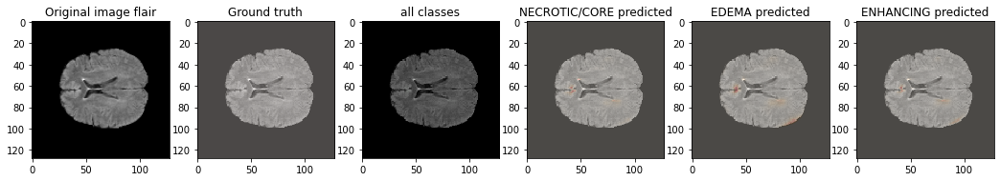

4/4 [==============================] - 0s 35ms/step


<Figure size 1296x3600 with 0 Axes>

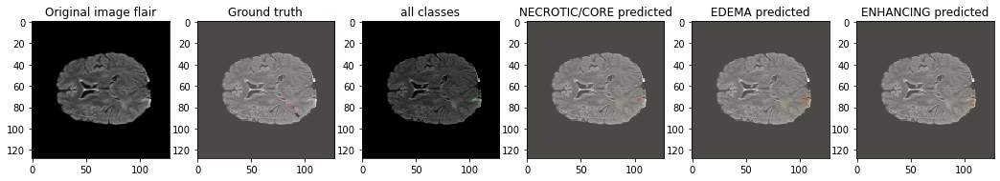

4/4 [==============================] - 0s 35ms/step


<Figure size 1296x3600 with 0 Axes>

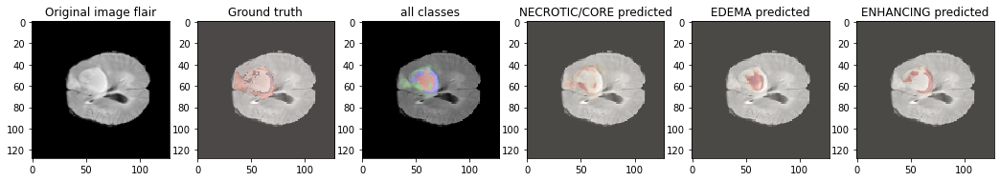

4/4 [==============================] - 0s 38ms/step


<Figure size 1296x3600 with 0 Axes>

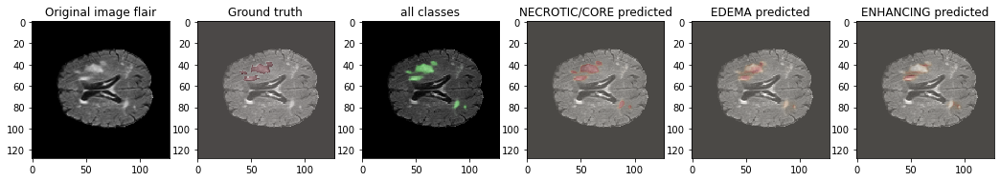

4/4 [==============================] - 0s 35ms/step


<Figure size 1296x3600 with 0 Axes>

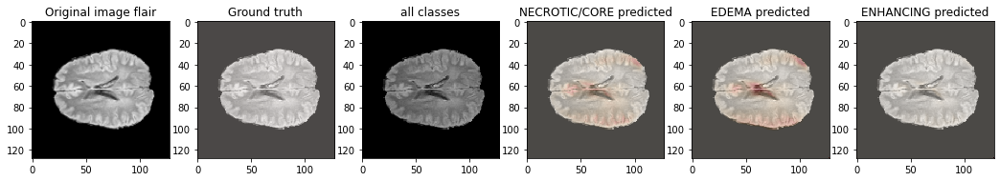

4/4 [==============================] - 0s 35ms/step


<Figure size 1296x3600 with 0 Axes>

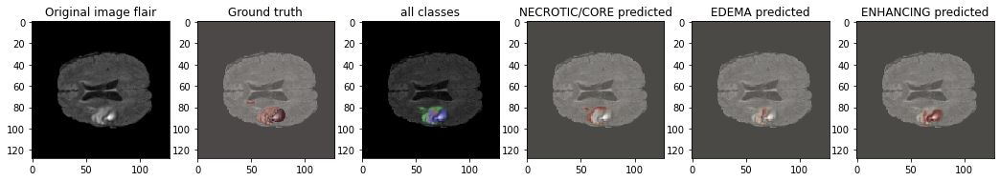

4/4 [==============================] - 0s 34ms/step


<Figure size 1296x3600 with 0 Axes>

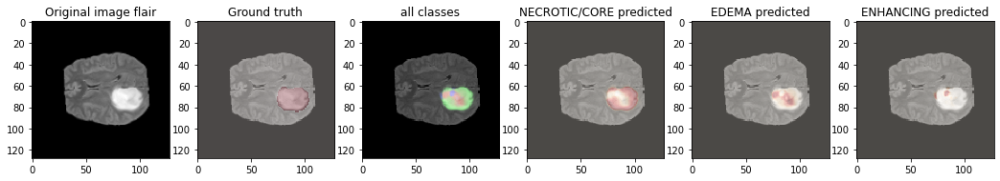

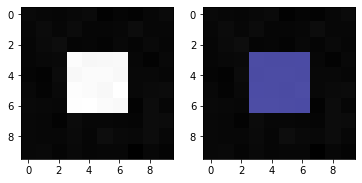

In [44]:
def predictByPath(case_path,case):
    files = next(os.walk(case_path))[2]
    X = np.empty((VOLUME_SLICES, IMG_SIZE, IMG_SIZE, 2))
  #  y = np.empty((VOLUME_SLICES, IMG_SIZE, IMG_SIZE))
    
    vol_path = os.path.join(case_path, f'BraTS20_Training_{case}_flair.nii');
    flair=nib.load(vol_path).get_fdata()
    
    vol_path = os.path.join(case_path, f'BraTS20_Training_{case}_t1ce.nii');
    ce=nib.load(vol_path).get_fdata() 
    
 #   vol_path = os.path.join(case_path, f'BraTS20_Training_{case}_seg.nii');
 #   seg=nib.load(vol_path).get_fdata()  

    
    for j in range(VOLUME_SLICES):
        X[j,:,:,0] = cv2.resize(flair[:,:,j+VOLUME_START_AT], (IMG_SIZE,IMG_SIZE))
        X[j,:,:,1] = cv2.resize(ce[:,:,j+VOLUME_START_AT], (IMG_SIZE,IMG_SIZE))
 #       y[j,:,:] = cv2.resize(seg[:,:,j+VOLUME_START_AT], (IMG_SIZE,IMG_SIZE))
        
  #  model.evaluate(x=X,y=y[:,:,:,0], callbacks= callbacks)
    return model.predict(X/np.max(X), verbose=1)


def showPredictsById(case, start_slice = 60):
    path = f"../input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_{case}"
    gt = nib.load(os.path.join(path, f'BraTS20_Training_{case}_seg.nii')).get_fdata()
    origImage = nib.load(os.path.join(path, f'BraTS20_Training_{case}_flair.nii')).get_fdata()
    p = predictByPath(path,case)

    core = p[:,:,:,1]
    edema= p[:,:,:,2]
    enhancing = p[:,:,:,3]

    plt.figure(figsize=(18, 50))
    f, axarr = plt.subplots(1,6, figsize = (18, 50)) 

    for i in range(6): # for each image, add brain background
        axarr[i].imshow(cv2.resize(origImage[:,:,start_slice+VOLUME_START_AT], (IMG_SIZE, IMG_SIZE)), cmap="gray", interpolation='none')
    
    axarr[0].imshow(cv2.resize(origImage[:,:,start_slice+VOLUME_START_AT], (IMG_SIZE, IMG_SIZE)), cmap="gray")
    axarr[0].title.set_text('Original image flair')
    curr_gt=cv2.resize(gt[:,:,start_slice+VOLUME_START_AT], (IMG_SIZE, IMG_SIZE), interpolation = cv2.INTER_NEAREST)
    axarr[1].imshow(curr_gt, cmap="Reds", interpolation='none', alpha=0.3) # ,alpha=0.3,cmap='Reds'
    axarr[1].title.set_text('Ground truth')
    axarr[2].imshow(p[start_slice,:,:,1:4], cmap="Reds", interpolation='none', alpha=0.3)
    axarr[2].title.set_text('all classes')
    axarr[3].imshow(edema[start_slice,:,:], cmap="OrRd", interpolation='none', alpha=0.3)
    axarr[3].title.set_text(f'{SEGMENT_CLASSES[1]} predicted')
    axarr[4].imshow(core[start_slice,:,], cmap="OrRd", interpolation='none', alpha=0.3)
    axarr[4].title.set_text(f'{SEGMENT_CLASSES[2]} predicted')
    axarr[5].imshow(enhancing[start_slice,:,], cmap="OrRd", interpolation='none', alpha=0.3)
    axarr[5].title.set_text(f'{SEGMENT_CLASSES[3]} predicted')
    plt.show()
    
    
showPredictsById(case=test_ids[0][-3:])
showPredictsById(case=test_ids[1][-3:])
showPredictsById(case=test_ids[2][-3:])
showPredictsById(case=test_ids[3][-3:])
showPredictsById(case=test_ids[4][-3:])
showPredictsById(case=test_ids[5][-3:])
showPredictsById(case=test_ids[6][-3:])


mask = np.zeros((10,10))
mask[3:-3, 3:-3] = 1 # white square in black background
im = mask + np.random.randn(10,10) * 0.01 # random image
masked = np.ma.masked_where(mask == 0, mask)

plt.figure()
plt.subplot(1,2,1)
plt.imshow(im, 'gray', interpolation='none')
plt.subplot(1,2,2)
plt.imshow(im, 'gray', interpolation='none')
plt.imshow(masked, 'jet', interpolation='none', alpha=0.7)
plt.show()

# Evaluation

In [28]:
test_ids

['BraTS20_Training_264',
 'BraTS20_Training_115',
 'BraTS20_Training_185',
 'BraTS20_Training_072',
 'BraTS20_Training_322',
 'BraTS20_Training_166',
 'BraTS20_Training_033',
 'BraTS20_Training_069',
 'BraTS20_Training_237',
 'BraTS20_Training_162',
 'BraTS20_Training_283',
 'BraTS20_Training_071',
 'BraTS20_Training_171',
 'BraTS20_Training_024',
 'BraTS20_Training_004',
 'BraTS20_Training_311',
 'BraTS20_Training_054',
 'BraTS20_Training_146',
 'BraTS20_Training_065',
 'BraTS20_Training_034',
 'BraTS20_Training_258',
 'BraTS20_Training_152',
 'BraTS20_Training_339',
 'BraTS20_Training_271',
 'BraTS20_Training_312',
 'BraTS20_Training_332',
 'BraTS20_Training_362',
 'BraTS20_Training_316',
 'BraTS20_Training_277',
 'BraTS20_Training_028',
 'BraTS20_Training_224',
 'BraTS20_Training_027',
 'BraTS20_Training_235',
 'BraTS20_Training_333',
 'BraTS20_Training_056',
 'BraTS20_Training_276',
 'BraTS20_Training_132',
 'BraTS20_Training_240',
 'BraTS20_Training_111',
 'BraTS20_Training_029',


4/4 [==============================] - 0s 37ms/step


<Figure size 432x288 with 0 Axes>

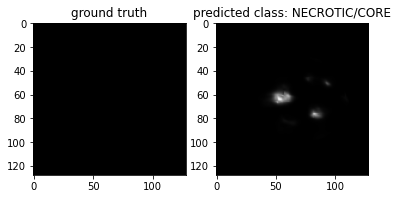

In [66]:
case = case=test_ids[3][-3:]

path = f"../input/brats20-dataset-training-validation/BraTS2020_TrainingData/MICCAI_BraTS2020_TrainingData/BraTS20_Training_{case}"
path2 = f"test_images/BraTS20_Training_{case}.jpg"
im = gt = nib.load(os.path.join(path, f'BraTS20_Training_{case}_flair.nii')).get_fdata()
gt = nib.load(os.path.join(path, f'BraTS20_Training_{case}_seg.nii')).get_fdata()
p = predictByPath(path,case)

core = p[:,:,:,1]
edema= p[:,:,:,2]
enhancing = p[:,:,:,3]


i=40 # slice at
eval_class = 1 #     0 : 'NOT tumor',  1 : 'ENHANCING',    2 : 'CORE',    3 : 'WHOLE'



gt[gt != eval_class] = 1 # use only one class for per class evaluation 

resized_gt = cv2.resize(gt[:,:,i+VOLUME_START_AT], (IMG_SIZE, IMG_SIZE))

plt.figure()
f, axarr = plt.subplots(1,2) 
axarr[0].imshow(resized_gt, cmap="gray")
axarr[0].title.set_text('ground truth')
axarr[1].imshow(p[i,:,:,eval_class], cmap="gray")
axarr[1].title.set_text(f'predicted class: {SEGMENT_CLASSES[eval_class]}')
plt.show()

In [67]:
min_value = np.min(gt)
max_value = np.max(gt)
print(min_value,max_value)

1.0 1.0


In [68]:
seg_path = os.path.join(path, f'BraTS20_Training_{case}_seg.nii')
seg = nib.load(seg_path).get_fdata()

In [69]:
seg.shape

(240, 240, 155)

**Advanced Plotting**

In [70]:
brain_parts = [
    {'img':im, 'color':'gray', 'level':0},
    {'img':seg, 'color':'purple', 'level':0},
    {'img':seg, 'color':'red', 'level':1},
    {'img':seg, 'color':'yellow', 'level':2},
    {'img':seg, 'color':'blue', 'level':3}
]

meshes = []
for part in brain_parts:
    print(part['color'],part['level'])
    verts, faces, normals, values = measure.marching_cubes(part['img'], part['level'])
    x, y, z = verts.T
    i, j, k = faces.T

    mesh = go.Mesh3d(x=x, y=y, z=z,color=part['color'], opacity=0.5, i=i, j=j, k=k)
    meshes.append(mesh)


bfig = go.Figure(data=meshes)
bfig.show()

gray 0
purple 0
red 1
yellow 2
blue 3


# **Size and ROI**

In [59]:
import os
import numpy as np
import pandas as pd
import nibabel as nib
from tqdm import tqdm

# Function to calculate the volume and size of the Region of Interest (ROI)
def calculate_roi_properties(mask):
    binary_mask = (mask > 0).astype(np.uint8)
    volume_roi = np.sum(binary_mask)
    roi_indices = np.where(binary_mask)
    min_x, max_x = np.min(roi_indices[0]), np.max(roi_indices[0])
    min_y, max_y = np.min(roi_indices[1]), np.max(roi_indices[1])
    min_z, max_z = np.min(roi_indices[2]), np.max(roi_indices[2])
    roi_size = (max_x - min_x + 1, max_y - min_y + 1, max_z - min_z + 1)
    return volume_roi, roi_size

In [59]:
# Create a DataFrame to store the results
roi_data = pd.DataFrame(columns=['Case_ID', 'Volume_ROI', 'Size_ROI_X', 'Size_ROI_Y', 'Size_ROI_Z'])
# Iterate through each case directory
for case_id in tqdm(train_ids + test_ids + val_ids, desc='Processing cases'):
    # Load the mask
    mask_path = os.path.join(TRAIN_DATASET_PATH, case_id, case_id + '_seg.nii')
    mask_data = nib.load(mask_path).get_fdata()
    
    # Calculate ROI properties
    volume_roi, roi_size = calculate_roi_properties(mask_data)
    
    # Append the results to the DataFrame
    roi_data = roi_data.append({'Case_ID': case_id,
                                'Volume_ROI': volume_roi,
                                'Size_ROI_X': roi_size[0],
                                'Size_ROI_Y': roi_size[1],
                                'Size_ROI_Z': roi_size[2]}, ignore_index=True)

# Save the DataFrame to a CSV file
roi_data.to_csv('roi_properties.csv', index=False)

In [59]:
df = pd.read_csv("/kaggle/input/roi-data/roi_properties.csv")
roi_volume = df['Volume_ROI']  # Your calculated volume of the ROI

# Define the desired range
desired_min = 0.5
desired_max = 111.4

# Calculate the current range of the ROI
current_min = np.min(roi_volume)
current_max = np.max(roi_volume)

# Calculate the scaling factor
scaling_factor = (desired_max - desired_min) / (current_max - current_min)

# Scale the volume
scaled_roi_volume = (roi_volume - current_min) * scaling_factor + desired_min

df['Volume_ROI'] = scaled_roi_volume

# Verify that the new volume range is within the desired range
print("Min:", np.min(scaled_roi_volume))
print("Max:", np.max(scaled_roi_volume))

df.to_csv('roi_properties.csv', index=False)

In [59]:
df = pd.read_csv("/kaggle/input/roi-data/roi_properties.csv")
df.head()

roi_data = pd.read_csv("/kaggle/input/roi-data/roi_properties.csv")
fig = px.line(roi_data, x='Case_ID', y='Volume_ROI', title='Volume of ROI for All Cases')
fig.update_xaxes(title='Case ID')
fig.update_yaxes(title='Volume')
fig.show()

In [59]:
plt.figure(figsize=(10, 6))
plt.hist(roi_data['Volume_ROI'], bins=20, color='skyblue', edgecolor='black')
plt.title('Histogram of ROI Volumes')
plt.xlabel('Volume')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# **Classsification Using CNN+LSTM**

In [1]:
import os
import cv2

datadir = '/kaggle/input/brain-tumor-mri-dataset/Brain_Tumor_Detection'
categories = ["yes","no"]
dataset = []
img_size = 150

for category in categories:
    path = os.path.join(datadir,category)
    class_num = categories.index(category)

    for img in os.listdir(path):
        try:
            img_array = cv2.imread(os.path.join(path,img),cv2.IMREAD_GRAYSCALE)
            new_array = cv2.resize(img_array,(img_size,img_size))
            dataset.append([new_array,class_num])
        except Exception as e:
            pass

print("Total images ->",len(dataset))

Total images -> 3000


In [2]:
import numpy as np

X = []
y = []

for features,label in dataset:
    X.append(features)
    y.append(label)
    
X = np.array(X).reshape(-1,img_size,img_size,1)
X = X/255.0
y = np.array(y).reshape(-1,1)

print("Dimension of input features ->",X.shape)
print("Dimension of output labels ->",y.shape)

Dimension of input features -> (3000, 150, 150, 1)
Dimension of output labels -> (3000, 1)


In [3]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state=42)

print("X_train shape ->",X_train.shape)
print("X_test shape ->",X_test.shape)
print("y_train shape ->",y_train.shape)
print("y_test shape ->",y_test.shape)

X_train shape -> (2400, 150, 150, 1)
X_test shape -> (600, 150, 150, 1)
y_train shape -> (2400, 1)
y_test shape -> (600, 1)


In [11]:
import tensorflow as tf
from tensorflow.keras import layers, models
from sklearn.model_selection import train_test_split

# Assume X_train and y_train are your training data and labels
# Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

# Define the input shape
input_shape = (16, 150, 150, 1)

# Define the model
model = models.Sequential()

# Rescaling layer for normalization
model.add(layers.Lambda(lambda x: x / 255.0, input_shape=input_shape[1:]))

# Convolutional layers
model.add(layers.Conv2D(16, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.BatchNormalization())
model.add(layers.MaxPooling2D((2, 2)))

# LSTM layer
model.add(layers.TimeDistributed(layers.Flatten()))
model.add(layers.LSTM(128))
model.add(layers.Dropout(0.5))  # Add dropout for regularization

# Dense layers
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.5))  # Add dropout for regularization
model.add(layers.Dense(2, activation='softmax'))  # Assuming 2 output classes

# Compile the model
model.compile(optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"])

# Print the model summary
model.summary()

from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint

# reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=5, verbose=1)
# early_stop = EarlyStopping(monitor='val_loss', patience=8, restore_best_weights=True)
# checkpoint = ModelCheckpoint('best_model.h5', monitor='val_loss', save_best_only=True)

history = model.fit(
    X_train, y_train,
    batch_size=50,
    epochs=35,
    validation_data=(X_val, y_val)
)

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda_2 (Lambda)            (None, 150, 150, 1)       0         
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 148, 148, 16)      160       
_________________________________________________________________
batch_normalization_6 (Batch (None, 148, 148, 16)      64        
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 74, 74, 16)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 72, 72, 32)        4640      
_________________________________________________________________
batch_normalization_7 (Batch (None, 72, 72, 32)        128       
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 36, 36, 32)       

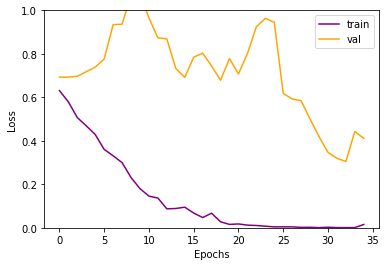

In [12]:
import matplotlib.pyplot as plt
plt.plot(history.history["loss"],c = "purple")
plt.plot(history.history["val_loss"],c = "orange")
plt.ylim([0,1])
plt.ylabel("Loss")
plt.xlabel("Epochs")
plt.legend(["train", "val"])
plt.show()

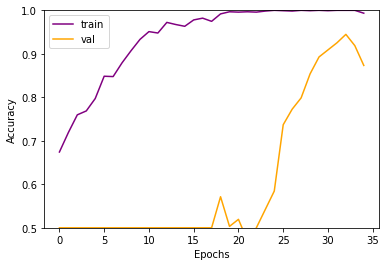

In [13]:
# plotting training and validation accuracy

plt.plot(history.history["accuracy"],c = "purple")
plt.plot(history.history["val_accuracy"],c = "orange")
plt.ylabel("Accuracy")
plt.ylim([0.5, 1])
plt.xlabel("Epochs")
plt.legend(["train", "val"])
plt.show()

In [17]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet import preprocess_input

# Load the test image using tf.keras.preprocessing.image
img = image.load_img(path2, target_size=(256, 256))
loaded_model = tf.keras.models.load_model("/kaggle/input/cnnandlstmmodel/tensorflow2/cnn_lstm/1")
img_array = image.img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
preprocessed_img = preprocess_input(img_array)
predictions = loaded_model.predict(preprocessed_img)
print(class_names[np.argmax(predictions)])

# RESNET 50 Model

In [ ]:
!pip3 install -U segmentation-models
%env SM_FRAMEWORK=tf.keras
import segmentation_models as sm
import tensorflow as tf
tf.keras.backend.set_image_data_format('channels_last')

In [ ]:
#Code mới
import sys
import os
import glob
import random
import time

import numpy as np
import pandas as pd

import cv2
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from sklearn.model_selection import train_test_split
from segmentation_models import Unet, Linknet, PSPNet, FPN
import keras
from segmentation_models.utils import set_trainable
from torch.utils.data import Dataset
from keras.models import load_model
from tensorflow.keras import utils as np_utils

In [ ]:
# dice loss as defined above for 4 classes
def dice_coef(y_true, y_pred, smooth=1.0):
    class_num = 4
    for i in range(class_num):
        y_true_f = K.flatten(y_true[:,:,:,i])
        y_pred_f = K.flatten(y_pred[:,:,:,i])
        intersection = K.sum(y_true_f * y_pred_f)
        loss = ((2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth))
   #     K.print_tensor(loss, message='loss value for class {} : '.format(SEGMENT_CLASSES[i]))
        if i == 0:
            total_loss = loss
        else:
            total_loss = total_loss + loss
    total_loss = total_loss / class_num
#    K.print_tensor(total_loss, message=' total dice coef: ')
    return total_loss


 
# define per class evaluation of dice coef
# inspired by https://github.com/keras-team/keras/issues/9395
def dice_coef_necrotic(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,1] * y_pred[:,:,:,1]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,1])) + K.sum(K.square(y_pred[:,:,:,1])) + epsilon)

def dice_coef_edema(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,2] * y_pred[:,:,:,2]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,2])) + K.sum(K.square(y_pred[:,:,:,2])) + epsilon)

def dice_coef_enhancing(y_true, y_pred, epsilon=1e-6):
    intersection = K.sum(K.abs(y_true[:,:,:,3] * y_pred[:,:,:,3]))
    return (2. * intersection) / (K.sum(K.square(y_true[:,:,:,3])) + K.sum(K.square(y_pred[:,:,:,3])) + epsilon)



# Computing Precision 
def precision(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

    
# Computing Sensitivity      
def sensitivity(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    return true_positives / (possible_positives + K.epsilon())


# Computing Specificity
def specificity(y_true, y_pred):
    true_negatives = K.sum(K.round(K.clip((1-y_true) * (1-y_pred), 0, 1)))
    possible_negatives = K.sum(K.round(K.clip(1-y_true, 0, 1)))
    return true_negatives / (possible_negatives + K.epsilon())

In [ ]:
# lists of directories with studies
train_and_val_directories = [f.path for f in os.scandir(TRAIN_DATASET_PATH) if f.is_dir()]

# file BraTS20_Training_355 has ill formatted name for for seg.nii file
train_and_val_directories.remove(TRAIN_DATASET_PATH+'BraTS20_Training_355')


def pathListIntoIds(dirList):
    x = []
    for i in range(0,len(dirList)):
        x.append(dirList[i][dirList[i].rfind('/')+1:])
    return x

train_and_test_ids = pathListIntoIds(train_and_val_directories); 

    
train_test_ids, val_ids = train_test_split(train_and_test_ids,test_size=0.2) 
train_ids, test_ids = train_test_split(train_test_ids,test_size=0.15)

In [ ]:
IMG_SIZE = 128
class DataGenerator(tf.keras.utils.Sequence):
    'Generates data for Keras'
    def __init__(self, list_IDs, dim=(IMG_SIZE,IMG_SIZE), batch_size = 1, n_channels = 2, shuffle=True):
        'Initialization'
        self.dim = dim
        self.batch_size = batch_size
        self.list_IDs = list_IDs
        self.n_channels = n_channels
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        'Denotes the number of batches per epoch'
        return int(np.floor(len(self.list_IDs) / self.batch_size))

    def __getitem__(self, index):
        'Generate one batch of data'
        # Generate indexes of the batch
        indexes = self.indexes[index*self.batch_size:(index+1)*self.batch_size]

        # Find list of IDs
        Batch_ids = [self.list_IDs[k] for k in indexes]

        # Generate data
        X, y = self.__data_generation(Batch_ids)

        return X, y

    def on_epoch_end(self):
        'Updates indexes after each epoch'
        self.indexes = np.arange(len(self.list_IDs))
        if self.shuffle == True:
            np.random.shuffle(self.indexes)

    def __data_generation(self, Batch_ids):
        'Generates data containing batch_size samples' # X : (n_samples, *dim, n_channels)
        # Initialization
        X = np.zeros((self.batch_size*VOLUME_SLICES, *self.dim, self.n_channels))
        y = np.zeros((self.batch_size*VOLUME_SLICES, 240, 240))
        Y = np.zeros((self.batch_size*VOLUME_SLICES, *self.dim, 4))

        
        # Generate data
        for c, i in enumerate(Batch_ids):
            case_path = os.path.join(TRAIN_DATASET_PATH, i)

            data_path = os.path.join(case_path, f'{i}_flair.nii');
            flair = nib.load(data_path).get_fdata()    

            data_path = os.path.join(case_path, f'{i}_t1ce.nii');
            ce = nib.load(data_path).get_fdata()
            
            data_path = os.path.join(case_path, f'{i}_seg.nii');
            seg = nib.load(data_path).get_fdata()
        
            for j in range(VOLUME_SLICES):
                 X[j +VOLUME_SLICES*c,:,:,0] = cv2.resize(flair[:,:,j+VOLUME_START_AT], (IMG_SIZE, IMG_SIZE));
                 X[j +VOLUME_SLICES*c,:,:,1] = cv2.resize(ce[:,:,j+VOLUME_START_AT], (IMG_SIZE, IMG_SIZE));

                 y[j +VOLUME_SLICES*c] = seg[:,:,j+VOLUME_START_AT];
                    
        # Generate masks
        y[y==4] = 3;
        mask = tf.one_hot(y, 4);
        Y = tf.image.resize(mask, (IMG_SIZE, IMG_SIZE));
        return X/np.max(X), Y
        
training_generator = DataGenerator(train_ids)
valid_generator = DataGenerator(val_ids)
test_generator = DataGenerator(test_ids)

In [ ]:
# show number of data for each dir 
def showDataLayout():
    plt.bar(["Train","Valid","Test"],
    [len(train_ids), len(val_ids), len(test_ids)], align='center',color=[ 'green','red', 'blue'])
    plt.legend()

    plt.ylabel('Number of images')
    plt.title('Data distribution')

    plt.show()
    
showDataLayout()

In [ ]:
csv_logger = CSVLogger('training_ResNet.log', separator=',', append=False)


callbacks = [
#     keras.callbacks.EarlyStopping(monitor='loss', min_delta=0,
#                               patience=2, verbose=1, mode='auto'),
      keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.2,
                              patience=2, min_lr=0.000001, verbose=1),
#  keras.callbacks.ModelCheckpoint(filepath = 'model_.{epoch:02d}-{val_loss:.6f}.m5',
#                             verbose=1, save_best_only=True, save_weights_only = True)
        csv_logger
    ]

In [ ]:
BACKBONE = 'resnet50'

preprocess_input = sm.get_preprocessing(BACKBONE)

# define network parameters
n_classes = 4 # case for binary and multiclass segmentation
activation = 'softmax'

#create model
model = sm.Unet(BACKBONE, classes=n_classes, activation=activation, encoder_weights=None, encoder_freeze=True, input_shape = (128,128,2))

# compile keras model with defined optimozer, loss and metrics
# model.compile(loss="categorical_crossentropy",
#               optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), 
#               metrics = [accuracy, dice_coef, precision, sensitivity, specificity, dice_coef_necrotic, dice_coef_edema ,dice_coef_enhancing] )
model.compile(loss="categorical_crossentropy", optimizer=keras.optimizers.Adam(learning_rate=0.001), metrics = ['accuracy',tf.keras.metrics.MeanIoU(num_classes=4), dice_coef, precision, sensitivity, specificity, dice_coef_necrotic, dice_coef_edema ,dice_coef_enhancing] )

In [ ]:
K.clear_session()

history =  model.fit(training_generator,
                     epochs=35,
                     steps_per_epoch=len(train_ids),
                     callbacks= callbacks,
                     validation_data = valid_generator
                     )  
model.save("RESNET_35EP_0_DOC_001.h5")

In [ ]:
plt.plot(history.history['loss'])
plt.ylabel('loss')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['accuracy'])
plt.ylabel('accuracy')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['dice_coef'])
plt.ylabel('dice_coef')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['sensitivity'])
plt.ylabel('sensitivity')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['specificity'])
plt.ylabel('specificity')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['dice_coef_necrotic'])
plt.ylabel('dice_coef_necrotic')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['dice_coef_edema'])
plt.ylabel('dice_coef_edema')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['dice_coef_enhancing'])
plt.ylabel('dice_coef_enhancing')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['val_accuracy'])
plt.ylabel('val_accuracy')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['val_dice_coef'])
plt.ylabel(' val_dice_coef')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['val_precision'])
plt.ylabel(' val_precision')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['val_sensitivity'])
plt.ylabel(' val_sensitivity')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['val_specificity'])
plt.ylabel(' val_specificity')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['val_dice_coef_necrotic'])
plt.ylabel(' val_dice_coef_necrotic')
plt.xlabel('Epoch')

In [ ]:
plt.plot(history.history['val_dice_coef_enhancing'])
plt.ylabel(' val_dice_coef_enhancing')
plt.xlabel('Epoch')

In [ ]:
history_unet = pd.read_csv('/kaggle/working/training.log', sep=',', engine='python')
history_unet.head()

In [ ]:
history_resnet = pd.read_csv('/kaggle/working/training_ResNet.log', sep=',', engine='python')
history_resnet.head()

In [ ]:
#accuracy comparision
unet_accuracies = history_unet['accuracy']
resnet_accuracies = history_resnet["accuracy"][:5]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet_accuracies) / len(unet_accuracies), sum(resnet_accuracies) / len(resnet_accuracies)], bar_width, label='Mean Accuracy')
plt.bar([i + bar_width for i in index], [max(unet_accuracies), max(resnet_accuracies)], bar_width, label='Max Accuracy')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('Accuracy (%)')
plt.title('Accuracy Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#diec_coeff comparision
unet = history_unet['dice_coef']
resnet = history_resnet["dice_coef"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet) / len(unet), sum(resnet) / len(resnet)], bar_width, label='Mean Diec Coeff')
plt.bar([i + bar_width for i in index], [max(unet), max(resnet)], bar_width, label='Max Diec Coeff')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('Diec Coeff (%)')
plt.title('Diec Coeff Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#diec_coeff comparision
unet = history_unet['dice_coef_edema']
resnet = history_resnet["dice_coef_edema"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet) / len(unet), sum(resnet) / len(resnet)], bar_width, label='Mean Diec Coeff Edema')
plt.bar([i + bar_width for i in index], [max(unet), max(resnet)], bar_width, label='Max Diec Coeff Edema')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('Diec Coeff Edema(%)')
plt.title('Diec Coeff of Edema Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#diec_coeff comparision
unet = history_unet['dice_coef_enhancing']
resnet = history_resnet["dice_coef_enhancing"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet) / len(unet), sum(resnet) / len(resnet)], bar_width, label='Mean Diec Coeff Enhancing')
plt.bar([i + bar_width for i in index], [max(unet), max(resnet)], bar_width, label='Max Diec Coeff Enhancing')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('Diec Coeff Enhancing(%)')
plt.title('Diec Coeff Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#diec_coeff comparision
unet = history_unet['dice_coef_necrotic']
resnet = history_resnet["dice_coef_necrotic"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet) / len(unet), sum(resnet) / len(resnet)], bar_width, label='Mean Diec Coeff Necrotic')
plt.bar([i + bar_width for i in index], [max(unet), max(resnet)], bar_width, label='Max Diec Coeff Necrotic')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('Diec Coeff Necrotic(%)')
plt.title('Diec Coeff Necrotic Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#Loss comparision
unet = history_unet['loss']
resnet = history_resnet["val_loss"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet) / len(unet), sum(resnet) / len(resnet)], bar_width, label='Mean loss')
plt.bar([i + bar_width for i in index], [max(unet), max(resnet)], bar_width, label='Max loss')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('loss)')
plt.title('loss Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#diec_coeff comparision
unet = history_unet['lr']
resnet = history_resnet["lr"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet) / len(unet), sum(resnet) / len(resnet)], bar_width, label='Mean lr')
plt.bar([i + bar_width for i in index], [max(unet), max(resnet)], bar_width, label='Max lr')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('LR)')
plt.title('LR Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#Precision comparision
unet = history_unet['precision']
resnet = history_resnet["precision"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet) / len(unet), sum(resnet) / len(resnet)], bar_width, label='Mean Precision')
plt.bar([i + bar_width for i in index], [max(unet), max(resnet)], bar_width, label='Max Precision')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('Precision)')
plt.title('Precision Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#sensitivity comparision
unet = history_unet['sensitivity']
resnet = history_resnet["sensitivity"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet) / len(unet), sum(resnet) / len(resnet)], bar_width, label='Mean sensitivity')
plt.bar([i + bar_width for i in index], [max(unet), max(resnet)], bar_width, label='Max sensitivity')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('sensitivity)')
plt.title('sensitivity Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#specificity comparision
unet = history_unet['specificity']
resnet = history_resnet["specificity"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet) / len(unet), sum(resnet) / len(resnet)], bar_width, label='Mean specificity')
plt.bar([i + bar_width for i in index], [max(unet), max(resnet)], bar_width, label='Max specificity')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('specificity)')
plt.title('specificity Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#IOU comparision
unet = history_unet['mean_io_u_1']
resnet = history_resnet["mean_io_u"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet) / len(unet), sum(resnet) / len(resnet)], bar_width, label='Mean IOU')
plt.bar([i + bar_width for i in index], [max(unet), max(resnet)], bar_width, label='Max IOU')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('IOU)')
plt.title('IOU Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#validation accuracy comparision
unet_accuracies = history_unet['val_accuracy']
resnet_accuracies = history_resnet["val_accuracy"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet_accuracies) / len(unet_accuracies), sum(resnet_accuracies) / len(resnet_accuracies)], bar_width, label='Mean Accuracy')
plt.bar([i + bar_width for i in index], [max(unet_accuracies), max(resnet_accuracies)], bar_width, label='Max Accuracy')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('val_Accuracy (%)')
plt.title('val_Accuracy Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()

In [ ]:
#val_diec_coeff comparision
unet = history_unet['val_dice_coef']
resnet = history_resnet["val_dice_coef"]

num_models = 2
# Index for each bar
index = range(num_models)

# Plotting the bar graph
plt.bar(index, [sum(unet) / len(unet), sum(resnet) / len(resnet)], bar_width, label='Mean Validation Diec Coeff')
plt.bar([i + bar_width for i in index], [max(unet), max(resnet)], bar_width, label='Max Validation Diec Coeff')

# Adding labels and title
plt.xlabel('Models')
plt.ylabel('Validation Diec Coeff (%)')
plt.title('Validation Diec Coeff Comparison between U-Net and ResNet')
plt.xticks([i + bar_width / 2 for i in index], ['U-Net', 'ResNet'])
plt.legend()

# Display the plot
plt.show()